# Control Design for a pendulum on a cart

In this example we will consider control design for the basic inverted pendulum on a cart. This system has two equilibria, one where the pendulum is hanging straight down, and one where it's balancing straight up. The upper one is unstable, making it slightly more interesting to design a controller for (even if the lower equilibrium is highly relevant, it's a good model for an overhead crane moving goods).

## System model

In this tutorial, we assume that we have the nonlinear dynamics of the system encodeed as a julia function `ẋ = cartpole(x, u)`, and linearize this to get a statespace system

$$
\dot{x} = Ax+Bu \\
y = Cx
$$

We make use of ForwardDiff.jl for the linearization. We start by defining the dynamics function

In [1]:
using ControlSystemsBase, RobustAndOptimalControl, ForwardDiff, LinearAlgebra, Plots

function cartpole(x, u)
    mc, mp, l, g = 1.0, 0.2, 0.5, 9.81

    q  = x[1:2]
    qd = x[3:4]

    s = sin(q[2])
    c = cos(q[2])

    H = [mc+mp mp*l*c; mp*l*c mp*l^2]
    C = [0.1 -mp*qd[2]*l*s; 0 0]
    G = [0, mp * g * l * s]
    B = [1, 0]

    qdd = -H \ (C * qd + G - B * u[1])
    return [qd; qdd]
end

nu = 1    # number of control inputs
nx = 4    # number of states
ny = 2    # number of outputs (here we assume that the cart position and the pendulum angle are measurable)

2

## Linearization

The next step is to choose an operating point around which to linearize and to calculate the Jacobians $A$ and $B$.

In [2]:
x0 = [0, π, 0, 0]
u0 = [0]

Ac = ForwardDiff.jacobian(x->cartpole(x, u0), x0)
Bc = ForwardDiff.jacobian(u->cartpole(x0, u), u0)
Cc = [1 0 0 0; 0 1 0 0]
Λ = Diagonal([0.4, deg2rad(25)]) # Maximum output ranges
Cc = Λ\Cc # This normalizes expected outputs to be ∈ [-1, 1], a good practice for MIMO systems

2×4 Matrix{Float64}:
 2.5  0.0      0.0  0.0
 0.0  2.29183  0.0  0.0

we package everything into a `StateSpace` object and visualize its poles and zeros:

In [3]:
sys = ss(Ac, Bc, Cc, 0)

StateSpace{Continuous, Float64}
A = 
 0.0   0.0                  1.0  0.0
 0.0   0.0                  0.0  1.0
 0.0   1.9620000000000002  -0.1  0.0
 0.0  23.544               -0.2  0.0
B = 
 0.0
 0.0
 1.0
 2.0
C = 
 2.5  0.0                0.0  0.0
 0.0  2.291831180523293  0.0  0.0
D = 
 0.0
 0.0

Continuous-time state-space model

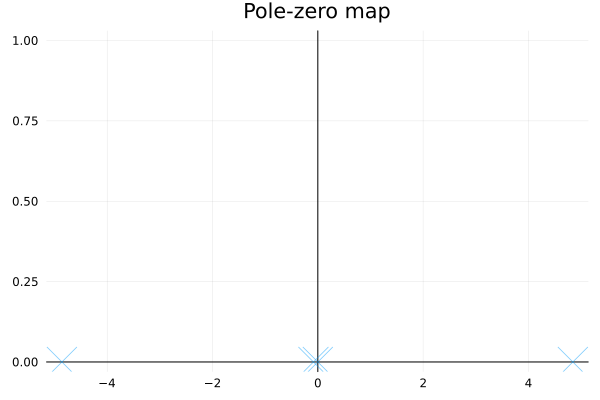

In [4]:
pzmap(sys)

## Control design

We will design a number of different controllers. We will start with a basic PID controller. Since the PID controller in its standard form really only handles SISO systems, we will also design a state-feedback controller with an observer to estimate the full state vector $x$ based on the two measurements $y$. Lastly, we will attempt to "robustify" the state-feedback controller using the `glover_mcfarlane` procedure.

Since the system has an unstable pole $p≈4.85p≈4.85rad/s$, there wil be fundamental limitations on the performance of the closed loop system. A common rule-of-thumb (see, e.g., Åström and Murray) is that a single RHP pole $p$ puts a lower limit on the gain crossover frequency $ω_{gc}>2p$, something to take into consideration when tuning our controllers. 

## PID controller

Since the PID controller only accepts a single measurement, we choose the measurement of the pendulum angle for feedback. While doing so, we notice that the number of states in the model can be reduced by the function `sminreal`.

In [5]:
P = sminreal(sys[2,1]) # Position state goes away, not observable

StateSpace{Continuous, Float64}
A = 
  0.0                  0.0  1.0
  1.9620000000000002  -0.1  0.0
 23.544               -0.2  0.0
B = 
 0.0
 1.0
 2.0
C = 
 2.291831180523293  0.0  0.0
D = 
 0.0

Continuous-time state-space model

this indicates that the state corresponding to the position of the cart is not observable from the measurement of the pendulum angle. This is slightly worrisome, but we nevertheless proceed to design a controller. By using a single measurement only, we have also introduced a zero in the system

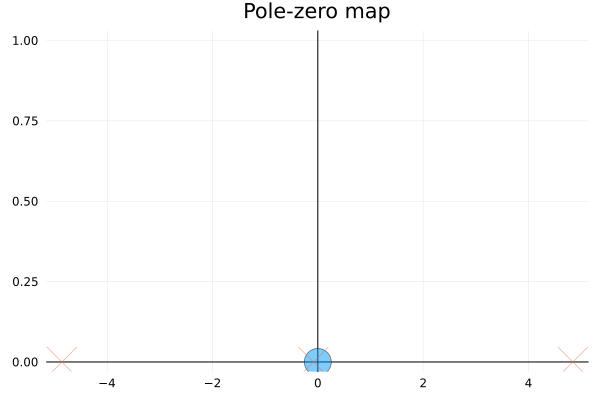

In [6]:
pzmap(P)

A PID controller can be constructed using the function `pid`. We start our tuning by a simple P controller

In [7]:
C = pid(1,0,0)

TransferFunction{Continuous, ControlSystemsBase.SisoRational{Int64}}
1
-
1

Continuous-time transfer function model

We will attempt to perform loop shaping using the PID controller, and plot the stability margins in a Bode plot using the function `marginplot`.

┌ Warning: Keyword argument hover not supported with Plots.GRBackend().  Choose from: annotations, arrow, aspect_ratio, background_color, background_color_inside, background_color_outside, background_color_subplot, bar_width, bins, bottom_margin, camera, clims, color_palette, colorbar, colorbar_entry, colorbar_scale, colorbar_title, colorbar_titlefont, colorbar_titlefontcolor, colorbar_titlefontrotation, colorbar_titlefontsize, connections, contour_labels, discrete_values, fill, fill_z, fillalpha, fillcolor, fillrange, fillstyle, flip, fontfamily, fontfamily_subplot, foreground_color, foreground_color_axis, foreground_color_border, foreground_color_grid, foreground_color_subplot, foreground_color_text, framestyle, grid, gridalpha, gridlinewidth, gridstyle, group, guide, guidefontcolor, guidefontfamily, guidefonthalign, guidefontrotation, guidefontsize, guidefontvalign, html_output_format, inset_subplots, label, layout, left_margin, legend_background_color, legend_column, legend_font, l

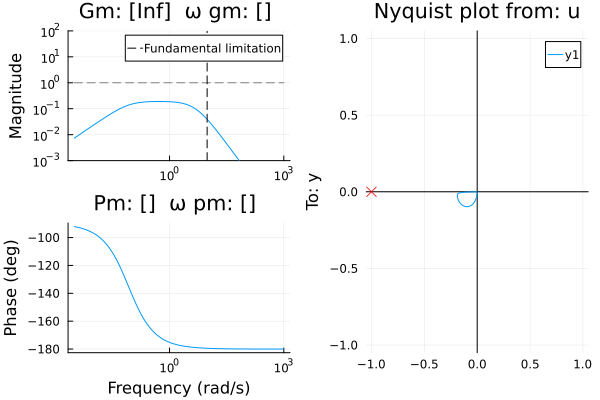

In [8]:
w = exp10.(LinRange(-2.5, 3, 500))
function pid_marginplot(C)
    f1 = marginplot(P*C, w)
    vline!([2*4.85], sp=1, lab="Fundamental limitation", l=(:dash, :black))
    ylims!((1e-3, 1e2), sp=1)
    f2 = nyquistplot(P*C)
    plot(f1, f2)
end
pid_marginplot(C)

We notice that the gain of the loop-transfer function $L=PC$ is much too low, and increase it, we also notice that the Nyquist plot fails to encircle to critical point, which it has to do once since we have one unstable pole. We will solve this in the end by adding integral action, but proceed for now to shape other parts of the loop. We start by lifting the Bode curve by increasing the gain:

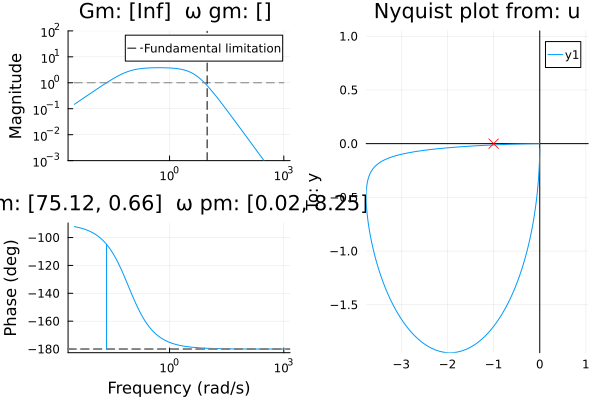

In [9]:
C = pid(20, 0, 0)
pid_marginplot(C)

we are now getting close to the rule-of-thumb for $ω_{gc}$​, but have a low loop gain at low frequencies. Remember, to get good disturbance rejection, we typically want a high loop gain at low frequencies. We also have an extremely small phase margin at 0.66 degrees. To fix the phase margin, we add some derivative gain. While adding derivative gain, it's also a good idea to add noise filtering (with a pure derivative term, the PID controller is not proper and can not be realized as a statespace system)

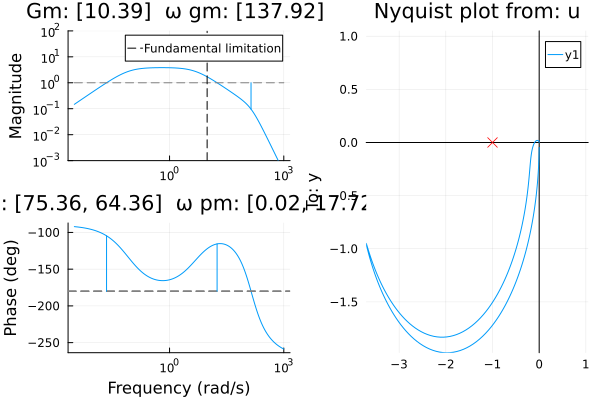

In [10]:
C = pid(20, 0, 0.2, Tf=0.01)
pid_marginplot(C)

The derivative term lifted the phase at $ω_{gc}$​ and we now have very nice phase margins. We also got a slight increase in ωgcωgc​ while at it.

The closed-loop system will still be unstable since the Nyquist curve fails to encircle the point -1, something we can check by calling

In [11]:
isstable(feedback(P*C))

false

We make the Nyquist curve wrap around the -1 point by adding integral gain:

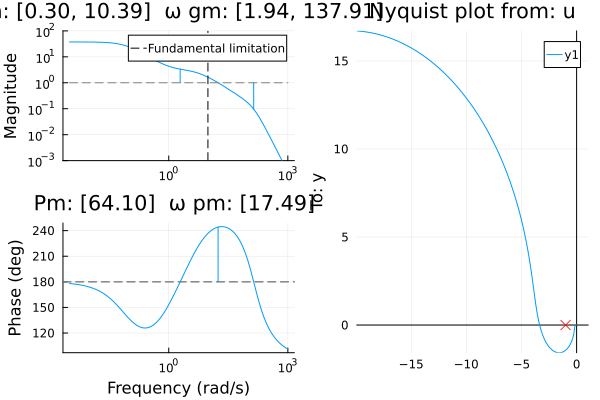

In [12]:
C = pid(20, 1.25, 0.2, Tf=0.01)
pid_marginplot(C)

Now, the Nyquist curve looks fine and the system is stable

In [13]:
isstable(minreal(feedback(P*C)))

true

If we simulate a disturbance acting on this system (feedback(P, C) is the transfer function from load disturbance to output)

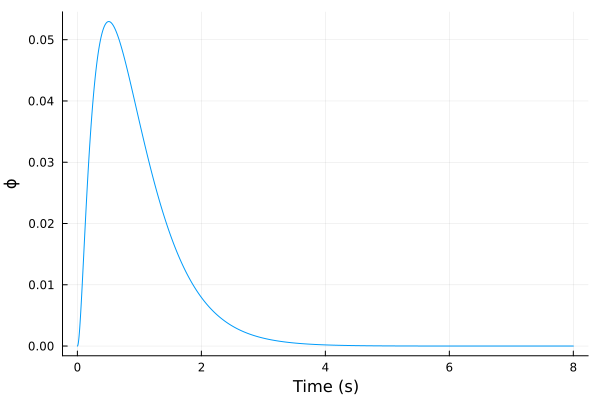

In [14]:
plot(step(feedback(P,C), 8), ylab="ϕ")

we see that we have a reasonable disturbance response.

To verify robustness properties, we plot the gang-of-four sensitivity functions:

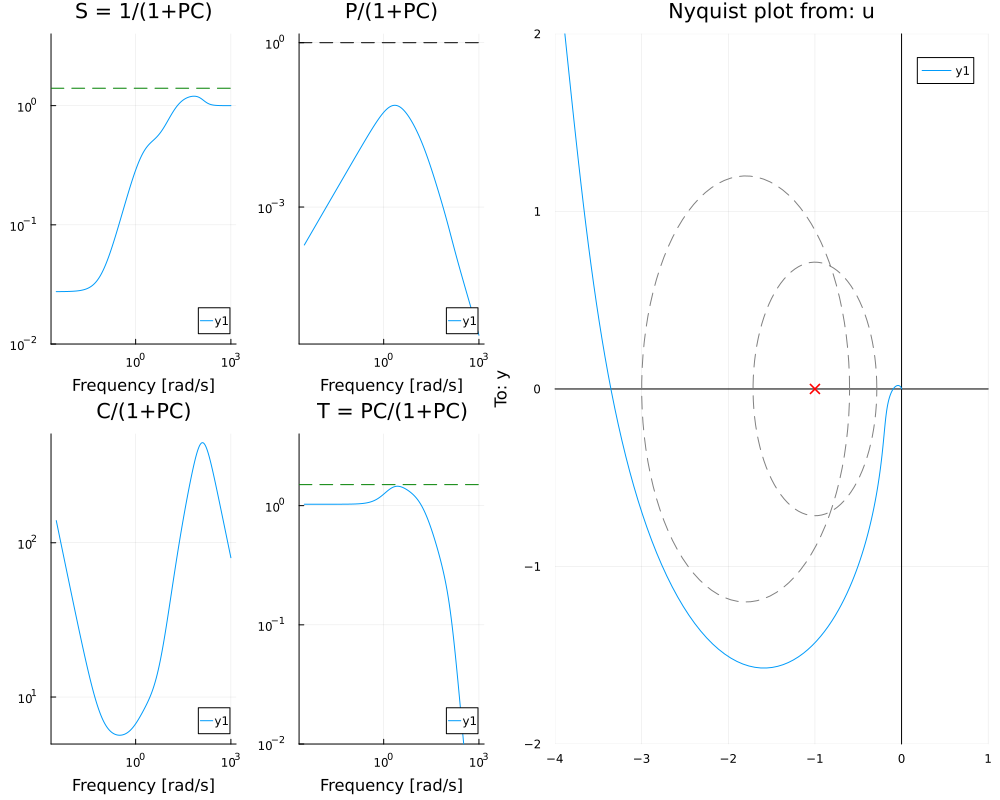

In [15]:
f1 = gangoffourplot(P,C,w, Ms_lines=[1.4], Mt_lines=[1.5])
f2 = nyquistplot(P*C, Ms_circles=[1.4], Mt_circles=[1.5], ylims=(-2, 2), xlims=(-4,1))
plot(f1, f2, size=(1000,800))

This all looks nice and we appear to have reasonable robustness margins, the Nyquist curve stays outside the $M_S=1.4$ circle and the $M_T=1.5$ circle.

However, there is a dragon lurking behind these plots. Remember the state corresponding the the cart position that was removed above? What has happened to this state? To investigate this, we form an ExtendedStateSpace model where we have both cart position and pendulum angle as controlled outputs, while keeping only the pendulum angle as measured output:

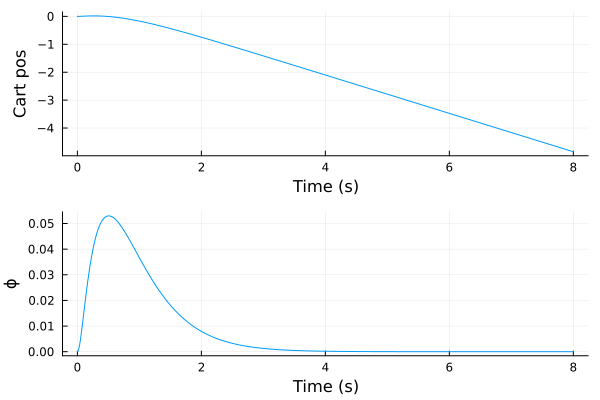

In [16]:
Pe = ExtendedStateSpace(sys, C2 = sys.C[2:2, :]) # Indicate that we can only measure the pendulum angle
Gecl = feedback(Pe, ss(C)) |> minreal
plot(step(Gecl, 8), ylab=["Cart pos" "ϕ"])

We see that the cart position drifts away without ever thinking about stopping. Indeed, the PID controller is unaware of this and can not really do anything about it. We could attempt to design a second control loop that would close the loop around the cart position, but we would have to carefully manage the interactions between the two loops. Instead, we move on to a state-feedback design, a methodology that makes handling multiple outputs much more straightforward. 

In [17]:
dampreport(sys)

|        Pole        |   Damping     |   Frequency   |   Frequency   | Time Constant |
|                    |    Ratio      |   (rad/sec)   |     (Hz)      |     (sec)     |
+--------------------+---------------+---------------+---------------+---------------+


| +0                 |  -1           |  0            |  0            |  -Inf         |
| -0.0833            |  1            |  0.0833       |  0.0133       |  12           |
| +4.84              |  -1           |  4.84         |  0.771        |  -0.206       |
| -4.86              |  1            |  4.86         |  0.774        |  0.206        |


we see that we have two poles at roughly $±4.85rad/s$, and almost two integrators. We thus keep the fast pole, and place the unstable pole at the same location (same bandwidth but stable instead of unstable). We also try to move the integrator poles to -5 to make the system nice and fast. 

In [18]:
desired_poles = [-4.85, -4.85, -5, -5]
L = place(sys, desired_poles, :c)

1×4 Matrix{Float64}:
 -29.9726  99.5196  -24.4489  22.0244

For the observer, we make use of the function `kalman`. We choose the covariance matrices R1, R2 that determine the amount of noise acting on the system and on the measurements respectively. We assume that there are two noise components, both entering as forces. One disturbance force acts on the cart and the other on the pendulum. We indicate this using the matrix $B_w$​. 

In [19]:
Bw = [0 0; 0 0; 1 0; 0 1]
R1 = Bw*I(2)*Bw'
R2 = 0.0001I(ny)
K = kalman(sys, R1, R2)

4×2 Matrix{Float64}:
  8.90448     -0.0161568
 -0.0176244    9.83322
 99.1125       0.481841
 -1.31513    110.801

With our feedback gain L and the Kalman gain K, we form the controller using `observer_controller`.

In [20]:
controller = observer_controller(sys, L, K)
@assert isstable(controller)
@assert isstable(feedback(sys * controller))

We may have a look at the Nyquist plot and the gang-of-four to assess robustness margins. In this case we look at the loop transfer function at the input simply because this function is SISO while the standard output-loop transfer is MIMO. This will allow us to asses robustness w.r.t. input perturbations only

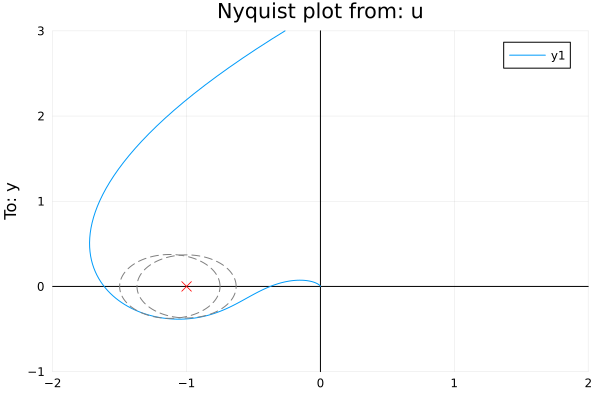

In [21]:
nyquistplot(controller*sys, w, Ms_circles=[2.7], Mt_circles=[3], xlims=(-2, 2), ylims=(-1, 3))

The Nyquist plot shows a rather weak robustness margin, with a peak in the input sensitivity of about $2.67$ and a peak in the complementary sensitivity function of around $3.02$ These can ve verified by calling `hinfnorm2`.

In [22]:
hinfnorm2(input_comp_sensitivity(sys, controller))

(3.021191368447901, 6.6727344419574495)

Also the gang-of-four indicate rather poor margins:

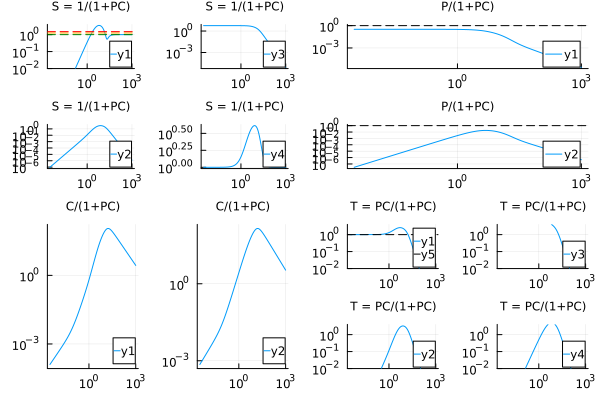

In [23]:
gangoffourplot(sys, controller, w, xlabel="", sigma=false, titlefont=8)

### Robustification using GLover-McFarlane

In an attempt at improving this initial design, we call `glover_mcfarlane`. This can be seen as a semi-automatic approach to robustifying an initial design, and will yield us an updated controller Kgmf with, hopefully, improved robustness properties.

In [24]:
Kgmf, γ, info = glover_mcfarlane(sys, 1.05; W1=controller)
@assert isstable(Kgmf)
γ

5.339895597411758

The γ is an indication of the achieved robustness. A value of γ<4γ<4 is typically desired, this time we did not quite achieve that, but will nevertheless proceed and look deeper into the robustness using other means.

#### Robustness verification

We will now verify these designs in a number of ways. We start by inspecting sensitivity functions at the input, this function tells you how a load disturbance at the plant input translates to total plant input (including control action)

┌ Warning: No strict ticks found
└ @ PlotUtils /Users/federicovillar/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/federicovillar/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191


┌ Warning: No strict ticks found
└ @ PlotUtils /Users/federicovillar/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/federicovillar/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191


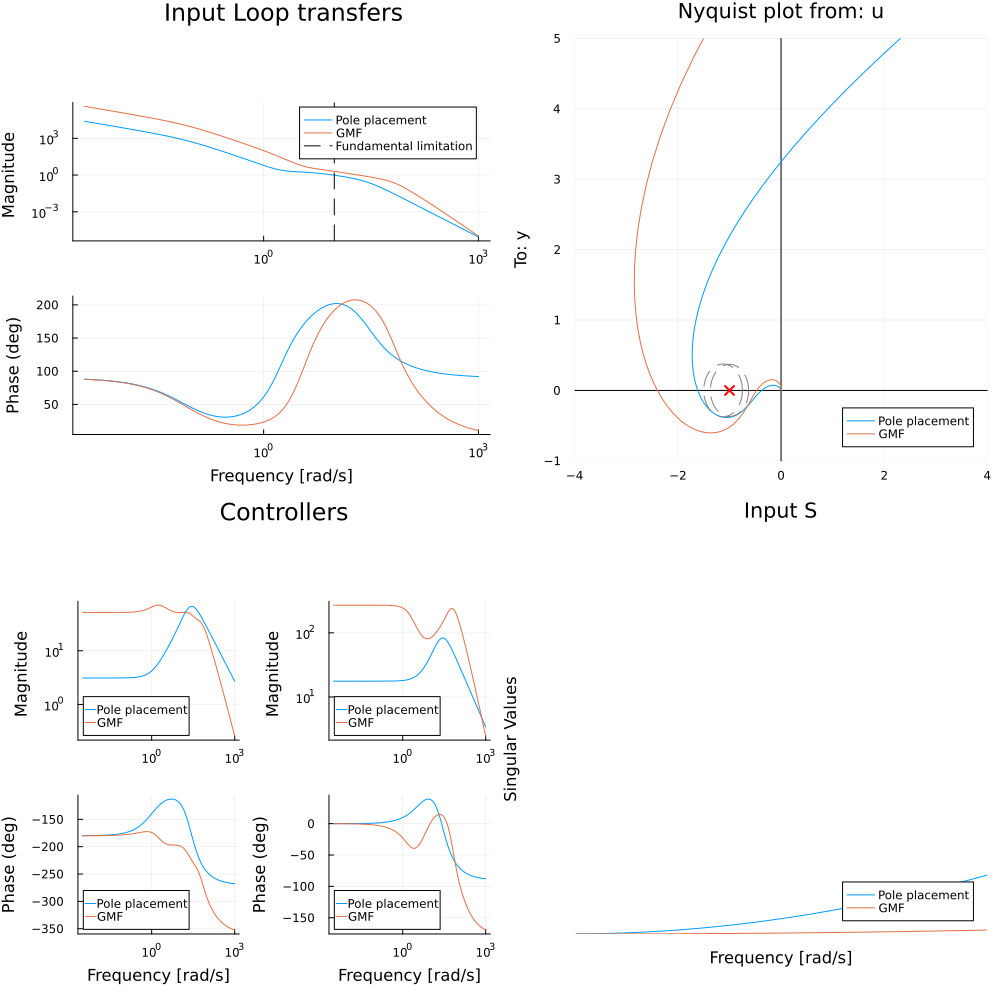

┌ Warning: No strict ticks found
└ @ PlotUtils /Users/federicovillar/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/federicovillar/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils /Users/federicovillar/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191


In [25]:
f1 = bodeplot([controller*sys, Kgmf*sys], w, plot_title="Input Loop transfers", lab=["Pole placement" "" "GMF" ""]); vline!([2*4.85], sp=1, lab="Fundamental limitation", l=(:dash, :black))
f2 = nyquistplot([controller*sys, Kgmf*sys], xlims=(-4, 4), ylims=(-1, 5), Ms_circles=[2.7], Mt_circles=[3], lab=["Pole placement" "GMF"])
f3 = bodeplot(controller, w, lab="Pole placement")
bodeplot!(Kgmf, w, plot_title="Controllers", lab="GMF", legend=:bottomleft)
f4 = sigmaplot([
    input_sensitivity(sys, controller),
    input_sensitivity(sys, Kgmf)
    ], w, title="Input S", lab=["Pole placement" "GMF"], legend=:bottomright)
plot(f1,f2,f3,f4, size=(1000,1000))

We see that the Glover-Mcfarlane method increased the gain crossover frequency $ω_{gc}$​ slightly compared to the initial pole-placement controller, as well as lifted the phase even further. It also increased the roll-off, providing better filtering of high-frequency noise. However, it uses quite a bit more gain from the measurement of the pendulum angle.

The gang-of-four, shown below, looks slightly better for the GMF controller, shown in orange.

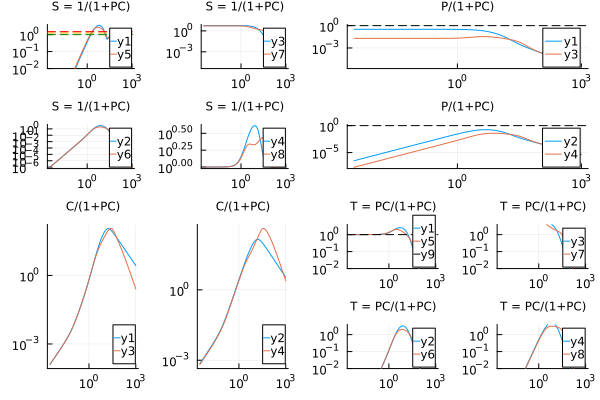

In [26]:
gangoffourplot(sys, [controller, Kgmf], w, xlabel="", sigma=false, titlefontsize=8)

The robustified controller has better disturbance rejection $(P/(I+PC))$ and slightly lower peaks in the sensitivity and complementary sensitivity functions.

Inspecting the singular values of the output sensitivity, we see that the GMF controller reduces the peak and improves the disturbance rejection for the lower singular value, while leaving the upper singular value more or less where it is for low frequencies.

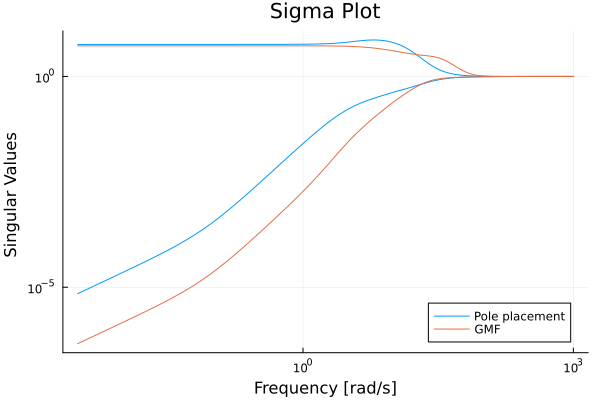

In [27]:
sigmaplot(sensitivity.(Ref(sys), [controller, Kgmf]), w, lab=["Pole placement" "GMF"], legend=:bottomright)

Further verification of robustness properties can be conducted by inspecting the diskmargins at inputs and at outputs

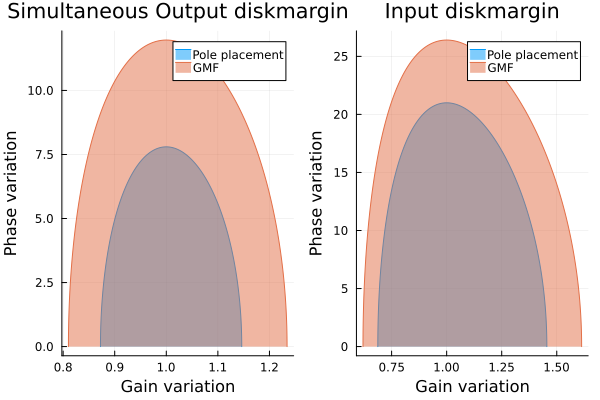

In [28]:
dmf1 = plot(diskmargin(sys*controller), title="Simultaneous Output diskmargin", lab="Pole placement")
dmf2 = plot(diskmargin(controller*sys), title="Input diskmargin", lab="Pole placement")
plot!(dmf1, diskmargin(sys*Kgmf), title="Simultaneous Output diskmargin", lab="GMF")
plot!(dmf2, diskmargin(Kgmf*sys), title="Input diskmargin", lab="GMF")
plot(dmf1, dmf2)

With the robustified controller, ee can tolerate a gain variation of about 1.6 at the plant input, but only 1.23 at the plant output. Please note that simultaneous margins can be quite conservative, it's much less likely that both outputs have equally large gain errors at the same time. One can also investigate the margins for one loop at a time using `loop_diskmargin`.

## Simulation

Finally, it's time to simulate the system. First we simulate the response to a reference step for the cart position, to make sure the cart takes a reasonalbe smooth step, keeping the pendulum angle within the validity range of the linearization, we let the step be a ramp from 0 to 1 over the course of one second, implemented by passing the input function $u(x,t)→[min⁡(t,1)]$

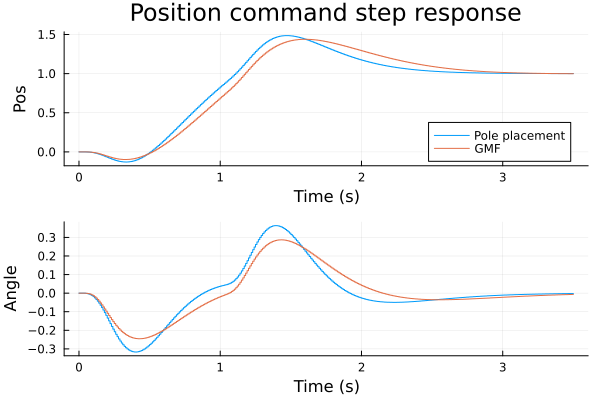

In [29]:
rampsim(sys) = lsim(sys[:, 1], (x,t)->[min(t, 1)], 0:0.01:3.5, method=:zoh) # helper function to simulate ramp input
plot([
    rampsim(feedback(sys*controller)),
    rampsim(feedback(sys*Kgmf)),
], ylab=["Pos" "Angle"], plot_title="Position command step response", lab=["Pole placement" "" "GMF" ""], legend=:bottomright)

Then we simulate the response to an impulsive disturbance acting on the cart (i.e., someone hit it with a hammer)

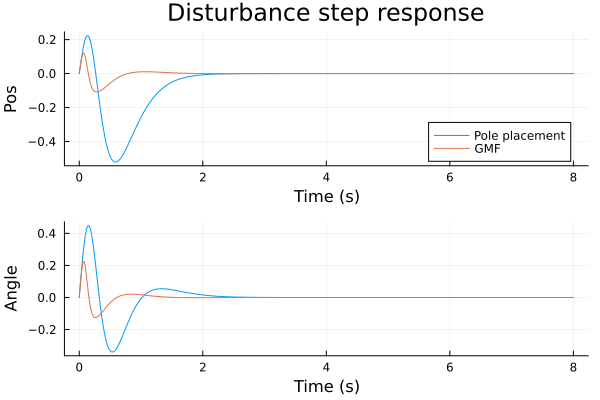

In [30]:
plot([
    impulse(feedback(sys, controller), 8, method=:zoh),
    impulse(feedback(sys, Kgmf), 8, method=:zoh),
], ylab=["Pos" "Angle"], plot_title="Disturbance step response", lab=["Pole placement" "" "GMF" ""], legend=:bottomright)

This time, the controllers control also the cart position while keeping the pendulum stabilized. Interestingly, while the GMF controller appears a bit slower during the reference change, maintaining a more conservative maximum angle of the pendulum, it is significantly faster in recovering from the disturbance.

We can also animate the system.

┌ Info: Saved animation to /var/folders/5d/171tq19d2dq_g4s2h4dxnqf40000gn/T/jl_RaR6nwtUBk.gif
└ @ Plots /Users/federicovillar/.julia/packages/Plots/p3KMq/src/animation.jl:156


Plots.AnimatedGif("/var/folders/5d/171tq19d2dq_g4s2h4dxnqf40000gn/T/jl_RaR6nwtUBk.gif")
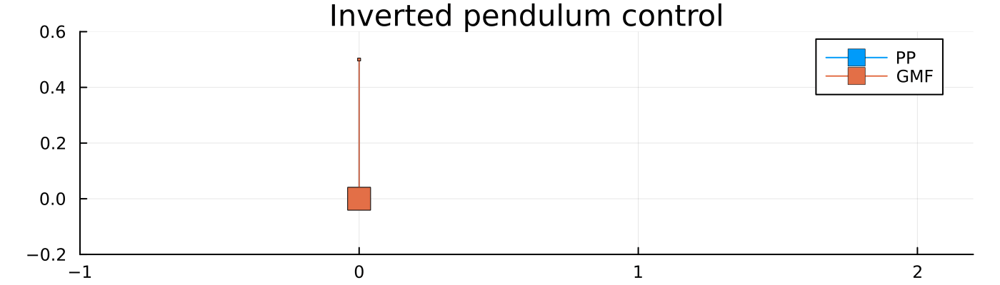

In [31]:
sim_pp  = rampsim(feedback(sys*controller))
sim_gmf = rampsim(feedback(sys*Kgmf))
@gif for i in 1:3:length(sim_pp.t)
    p, a = sim_pp.y[:, i]
    plot([p; p - 0.5sin(a)], [0; 0.5cos(a)], lw = 1, markershape = :square, markersize=[8, 1], lab = "PP", dpi = 200, size=(700, 200))

    p, a = sim_gmf.y[:, i]
    plot!([p; p - 0.5sin(a)], [0; 0.5cos(a)], lw = 1, markershape = :square, markersize=[8, 1], lab = "GMF", xlims = (-1, 2.2),
        ylims = (-0.2, 0.6), title = "Inverted pendulum control",
        dpi = 200, aspect_ratio = 1)
end

## Cascade control

The system considered in this example has a single input, but more than one output (position and angle). When we neglected the measurement of the position of the cart and closed the loop around the angle only, we got an unstable system when considering the cart position as well. However, we could add an "outer controller" in cascade with the inner PID controller we designed above, and let the outer controller control the position of the cart. This kind of control architecture is often called a cascade controller, and this is a common and simple way to design a controller for a SIMO system. Below, we add a PI controller for the cart position and simulate the same response to an input disturbance as we did above. It's important to not tune this outer controller too hard or it will start to destabilize the inner system.

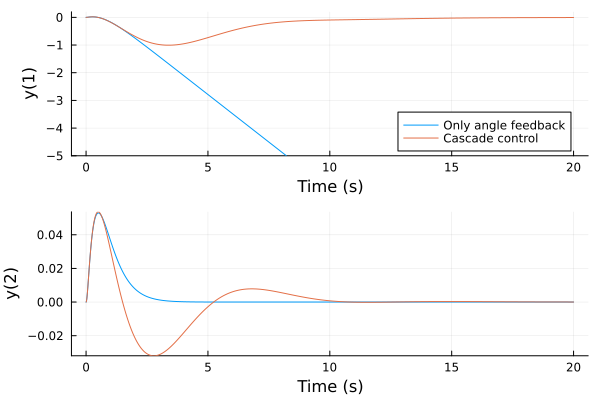

In [32]:
Cp = pid(-1, 5; state_space=true) # Position controller
Gtotal = feedback(Gecl, Cp, Y1=[1]) # Indicate that the outer controller can only see the cart position (y1)
plot(step.([Gecl, Gtotal], 20), lab=["Only angle feedback" "" "Cascade control" ""], legend=:bottomright, ylims=[(-5, 0.2) (-Inf, Inf)])

## Conclusion

We started out designing a PID controller and used the Bode plot to guide the tuning. While we ended up with a controller with good robustness margins, we had completely forgotten about the cart position and the controller turned out to not stabilize this "hidden state". We include this example here as an example of following a mostly sound procedure, leading to a robust controller, but failing to meet real-world constraints due to lack of observability. To stabilize also the cart position, we added an outer position controller in cascade with the inner angle controller.

The loop-shaping procedure yielded a controller that stabilized all states of the plant, but with questionable robustness margins. In practice, pole placement can be rather difficult and it's not always obvious where to place the poles to achieve a robust design. In this case, a robust design is very hard to achieve with a pole-placement controller without model augmentation, the poor robustness of the pole-placement controller compared to the PID controller is due to the low gain at low frequencies, indeed, the pole placement controller lacks integral action! See [Disturbance modeling and rejection with LQG controllers](https://juliacontrol.github.io/RobustAndOptimalControl.jl/dev/lqg_disturbance/#Disturbance-modeling-and-rejection-with-LQG-controllers) for a tutorial on how to add integral action to state-feedback controllers by augmenting the system model with a disturbance model.

We looked at several different ways of quantifying robustness of a system with multiple outputs, and tried our luck with a procedure for automatic robustification, `glover_mcfarlane`. In this case, the procedure worked and we got a slightly more robust controller as a result, this controller also increased the gain for low frequencies significantly, further indicating that the low-frequency gain was a source of problems for the pole-placement controller. The result of the Glover-McFarlane procedure may either be used directly as the final controller, or to provide insight into how the procedure modifies the existing controller in order to improve robustness.